# Setup and Imports

In [2]:
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from torchvision.utils import make_grid

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [3]:
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# PlantVillage Dataset

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mohitsingh1804/plantvillage")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'plantvillage' dataset.
Path to dataset files: /kaggle/input/plantvillage


# DATASET STRUCTURE EXPLORATION

In [6]:
dataset_path = os.path.join(path, "PlantVillage")
train_path = os.path.join(dataset_path, "train")
val_path = os.path.join(dataset_path, "val")

print("Dataset path:", dataset_path)
print("Train path:", train_path)
print("Validation path:", val_path)

Dataset path: /kaggle/input/plantvillage/PlantVillage
Train path: /kaggle/input/plantvillage/PlantVillage/train
Validation path: /kaggle/input/plantvillage/PlantVillage/val


In [7]:
train_classes = sorted(os.listdir(train_path))
val_classes = sorted(os.listdir(val_path))

print("Number of train classes:", len(train_classes))
print("Number of validation classes:", len(val_classes))

print("\nSame classes in train and validation:",
      train_classes == val_classes)

Number of train classes: 38
Number of validation classes: 38

Same classes in train and validation: True


# DATAFRAME CREATION

In [8]:
# Converting image_path + classes to pandas dataframe for understanding data
def create_image_dataframe(root_path , split_name="train"):
    data =[]

    for class_name in os.listdir(root_path):
      class_path = os.path.join(root_path, class_name)

      if os.path.isdir(class_path):
        for img_name in os.listdir(class_path):
          img_path = os.path.join(class_path, img_name)

          if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            data.append({
                'image_path': img_path,
                'class': class_name,
                'split': split_name
            })

    return pd.DataFrame(data)

In [9]:
train_df = create_image_dataframe(train_path, "train")
val_df = create_image_dataframe(val_path, "val")

In [10]:
# combine
df = pd.concat([train_df, val_df], ignore_index=True)

In [11]:
# ADD LABEL ENCODING
le = LabelEncoder()
df['label'] = le.fit_transform(df['class'])

print("\nLabel Encoding:")
class_to_label = dict(zip(le.classes_, le.transform(le.classes_)))
for cls, lbl in class_to_label.items():
    print(f"{cls} → {lbl}")


Label Encoding:
Apple___Apple_scab → 0
Apple___Black_rot → 1
Apple___Cedar_apple_rust → 2
Apple___healthy → 3
Blueberry___healthy → 4
Cherry_(including_sour)___Powdery_mildew → 5
Cherry_(including_sour)___healthy → 6
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → 7
Corn_(maize)___Common_rust_ → 8
Corn_(maize)___Northern_Leaf_Blight → 9
Corn_(maize)___healthy → 10
Grape___Black_rot → 11
Grape___Esca_(Black_Measles) → 12
Grape___Leaf_blight_(Isariopsis_Leaf_Spot) → 13
Grape___healthy → 14
Orange___Haunglongbing_(Citrus_greening) → 15
Peach___Bacterial_spot → 16
Peach___healthy → 17
Pepper,_bell___Bacterial_spot → 18
Pepper,_bell___healthy → 19
Potato___Early_blight → 20
Potato___Late_blight → 21
Potato___healthy → 22
Raspberry___healthy → 23
Soybean___healthy → 24
Squash___Powdery_mildew → 25
Strawberry___Leaf_scorch → 26
Strawberry___healthy → 27
Tomato___Bacterial_spot → 28
Tomato___Early_blight → 29
Tomato___Late_blight → 30
Tomato___Leaf_Mold → 31
Tomato___Septoria_leaf_spot →

In [12]:
# Save for later use
df.to_csv('plant_disease_dataset.csv', index=False)
print("\nDataFrame saved as 'plant_disease_dataset.csv'")


DataFrame saved as 'plant_disease_dataset.csv'


# EDA & VISUALIZATION

In [13]:
print(f"Total Images: {len(df)}")
print(f"Train Images: {len(train_df)}")
print(f"Validation Images: {len(val_df)}")
print(f"Unique Classes: {df['class'].nunique()}")

Total Images: 54305
Train Images: 43444
Validation Images: 10861
Unique Classes: 38


In [14]:
df.head()

,image_path,class,split,label
0,/kaggle/input/plantvillage/PlantVillage/train/...,Tomato___Late_blight,train,30
1,/kaggle/input/plantvillage/PlantVillage/train/...,Tomato___Late_blight,train,30
2,/kaggle/input/plantvillage/PlantVillage/train/...,Tomato___Late_blight,train,30
3,/kaggle/input/plantvillage/PlantVillage/train/...,Tomato___Late_blight,train,30
4,/kaggle/input/plantvillage/PlantVillage/train/...,Tomato___Late_blight,train,30


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54305 entries, 0 to 54304
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  54305 non-null  object
 1   class       54305 non-null  object
 2   split       54305 non-null  object
 3   label       54305 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 1.7+ MB


In [16]:
split_counts = df['split'].value_counts()
print(split_counts)

split
train    43444
val      10861
Name: count, dtype: int64


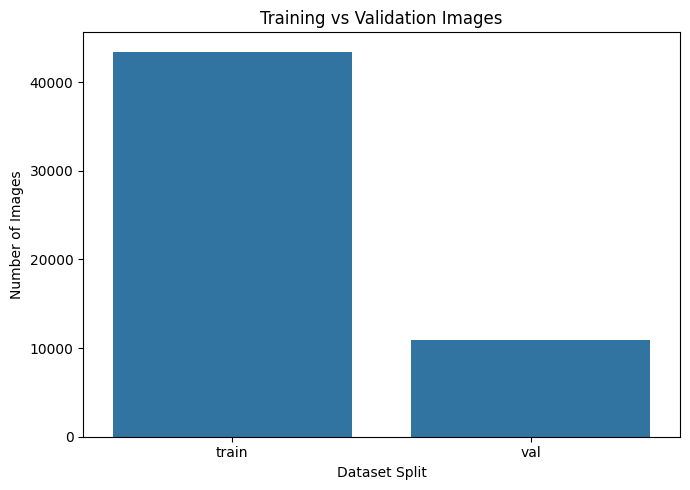

In [17]:
plt.figure(figsize=(7, 5))

sns.barplot(
    x=split_counts.index,
    y=split_counts.values
)

plt.title("Training vs Validation Images")
plt.xlabel("Dataset Split")
plt.ylabel("Number of Images")

plt.tight_layout()
plt.show()

In [18]:
# class imbalance analysis
class_counts = (
    df['class']
    .value_counts()
    .sort_values(ascending=False)
)

print(class_counts)

class
Orange___Haunglongbing_(Citrus_greening)              5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus                5357
Soybean___healthy                                     5090
Peach___Bacterial_spot                                2297
Tomato___Bacterial_spot                               2127
Tomato___Late_blight                                  1909
Squash___Powdery_mildew                               1835
Tomato___Septoria_leaf_spot                           1771
Tomato___Spider_mites Two-spotted_spider_mite         1676
Apple___healthy                                       1645
Tomato___healthy                                      1591
Blueberry___healthy                                   1502
Pepper,_bell___healthy                                1478
Tomato___Target_Spot                                  1404
Grape___Esca_(Black_Measles)                          1383
Corn_(maize)___Common_rust_                           1192
Grape___Black_rot                                 

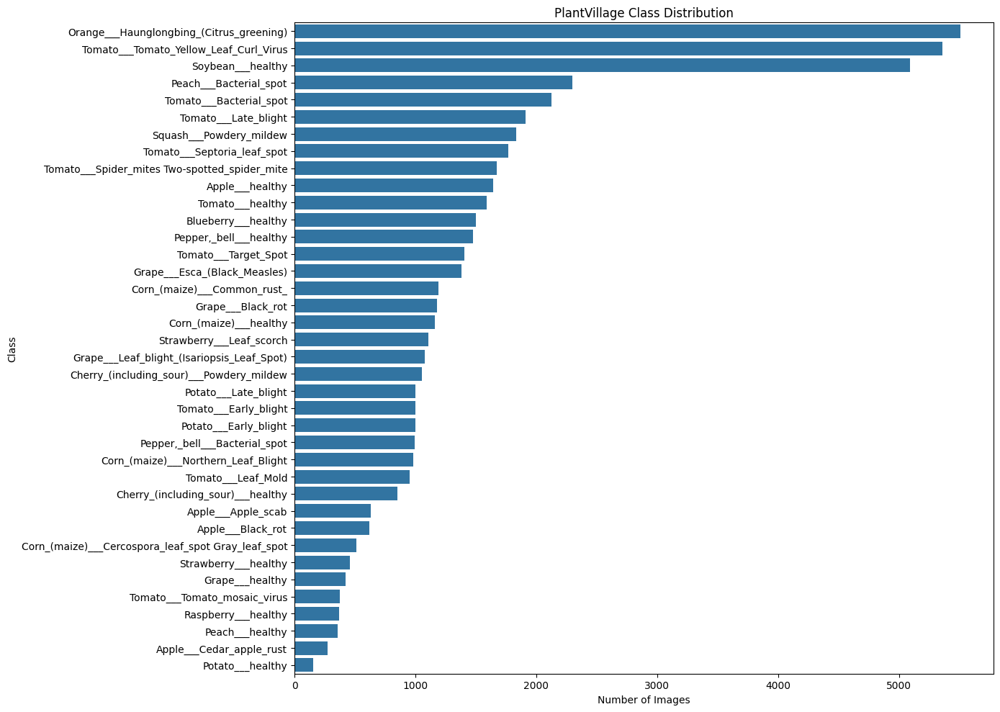

In [19]:
plt.figure(figsize=(14, 10))

sns.barplot(
    x=class_counts.values,
    y=class_counts.index
)
plt.title("PlantVillage Class Distribution")
plt.xlabel("Number of Images")
plt.ylabel("Class")
plt.tight_layout()
plt.show()

In [20]:
max_count = class_counts.max()
min_count = class_counts.min()

imbalance_ratio = max_count / min_count

print("Maximum class size:", max_count)
print("Minimum class size:", min_count)
print("Imbalance ratio:", round(imbalance_ratio, 2))

Maximum class size: 5507
Minimum class size: 152
Imbalance ratio: 36.23


In [21]:
sample_paths = df['image_path'].sample(
    n=min(500, len(df)),
    random_state=42
)
image_sizes = []

for image_path in sample_paths:
    try:
        with Image.open(image_path) as img:
            image_sizes.append(img.size)
    except:
        pass


size_df = pd.DataFrame(
    image_sizes,
    columns=['width', 'height']
)

size_df.head()

,width,height
0,256,256
1,256,256
2,256,256
3,256,256
4,256,256


In [22]:
print("Unique image sizes:")
print(size_df.value_counts().head(20))

print("\nMost common image size:")
print(size_df.value_counts().index[0])

Unique image sizes:
width  height
256    256       500
Name: count, dtype: int64

Most common image size:
(np.int64(256), np.int64(256))


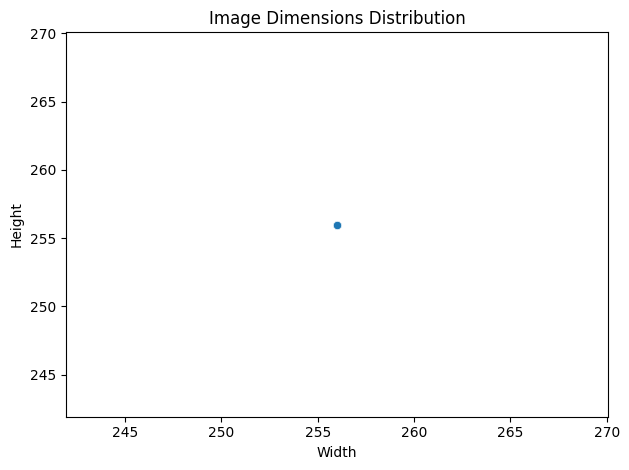

In [23]:
sns.scatterplot(
    data=size_df,
    x='width',
    y='height'
)

plt.title("Image Dimensions Distribution")
plt.xlabel("Width")
plt.ylabel("Height")

plt.tight_layout()
plt.show()

In [24]:
sample_row = df.sample(
    n=1,
    random_state=42
).iloc[0]

image_path = sample_row['image_path']
class_name = sample_row['class']

image = Image.open(image_path)

print("Class :", class_name)
print("Path  :", image_path)
print("Size  :", image.size)
print("Mode  :", image.mode)

Class : Soybean___healthy
Path  : /kaggle/input/plantvillage/PlantVillage/train/Soybean___healthy/d349e512-4131-45c5-9783-6eb581396485___RS_HL 7491.JPG
Size  : (256, 256)
Mode  : RGB


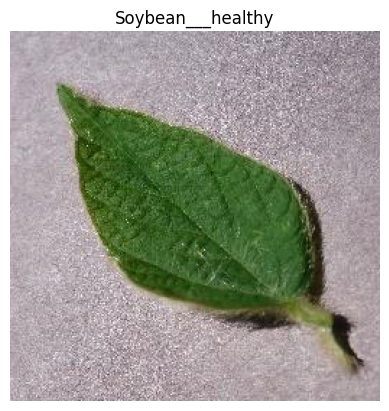

In [25]:
plt.imshow(image)
plt.title(class_name)
plt.axis("off")

plt.show()

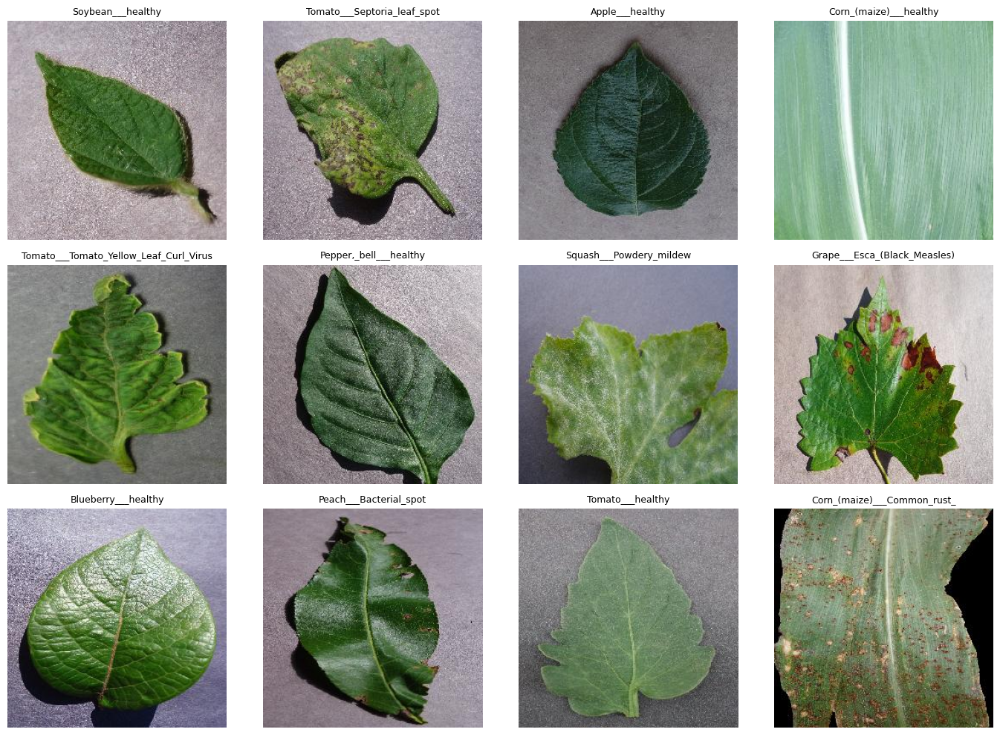

In [26]:
sample_df = df.sample(
    n=12,
    random_state=42
)

fig, axes = plt.subplots(
    3, 4,
    figsize=(14, 10)
)

for ax, (_, row) in zip(axes.flat, sample_df.iterrows()):

    image = Image.open(row['image_path'])
    ax.imshow(image)
    ax.set_title(row['class'], fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

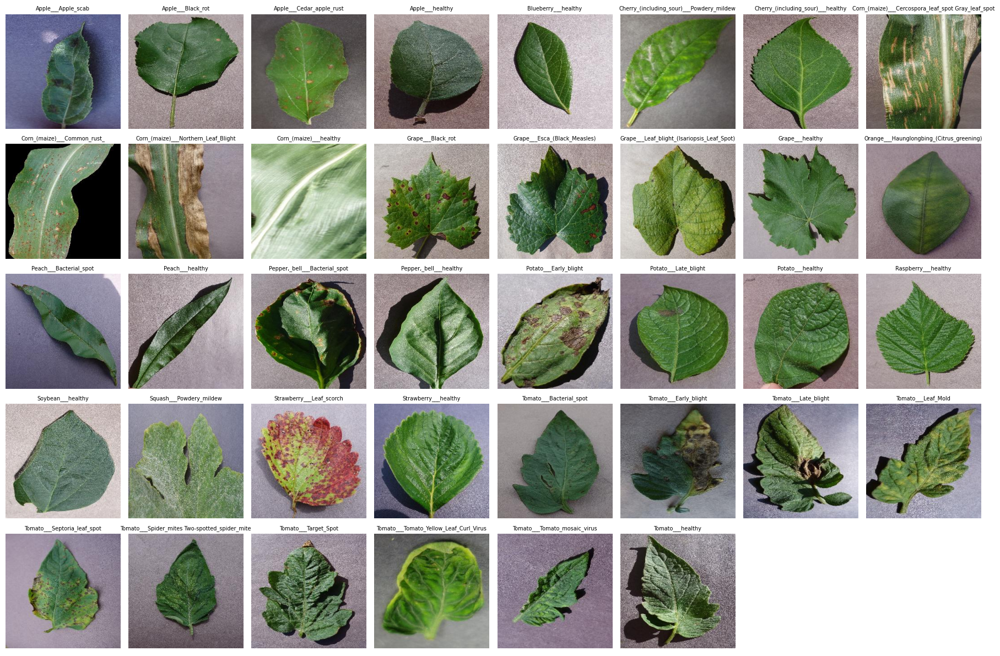

In [27]:
classes = sorted(df['class'].unique())

fig, axes = plt.subplots(
    5,
    8,
    figsize=(18, 12)
)

for ax, class_name in zip(axes.flat, classes):

    class_images = df[
        df['class'] == class_name
    ]

    image_path = class_images.iloc[0]['image_path']

    image = Image.open(image_path)

    ax.imshow(image)
    ax.set_title(
        class_name,
        fontsize=7
    )
    ax.axis("off")

# Hide unused axes
for ax in axes.flat[len(classes):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [28]:
modes = []

for image_path in sample_paths:

    try:
        with Image.open(image_path) as img:
            modes.append(img.mode)

    except:
        pass

mode_counts = pd.Series(modes).value_counts()

print(mode_counts)

RGB    500
Name: count, dtype: int64


# IMAGE PREPROCESSING

In [29]:
IMG_SIZE = 224

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
'''ImageNet ek 1.4 million images ka gigantic dataset hai jis par PyTorch ke saare pre-trained models train hotay hain.
Yeh numbers ImageNet ke poore dataset ke Red, Green, Blue (RGB) channels ka calculated Mean (average) aur Standard Deviation hain.'''

train_transform = transforms.Compose([    # Multi-step pipeline chaining
    transforms.Resize((IMG_SIZE, IMG_SIZE)),    # Har image ko exact 224 \times 224 matrix dimensions mein crop karta hai.
    transforms.ToTensor(),    # Image ko PIL format (pixels 0–255) se PyTorch Tensor float format (0.0–1.0) mein convert karta hai aur dimensions re-arrange karta hai:
    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])


val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

#  Automatic folder-based labeling engine.
train_dataset = datasets.ImageFolder(     # ImageFolder folder names read karke khud class IDs assign kar deta hai aur har image par transformation apply karta
    root=train_path,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=val_path,
    transform=val_transform
)


print("Training images:", len(train_dataset))
print("Validation images:", len(val_dataset))
print("Number of classes:", len(train_dataset.classes))

Training images: 43444
Validation images: 10861
Number of classes: 38


# DATA AUGMENTATION

Training block mein Data Augmentation add ki gayi hai taake model overfitting se bache.

In [30]:
IMG_SIZE = 224

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),   # 50% chance ke sath image ko horizontally mirror (ult) kar deta hai.
    transforms.RandomRotation(degrees=15),    # Image ko -15 se +15 degree ke darmiyan kisi bhi random angle par rotate kar deta hai.
    transforms.ColorJitter( brightness=0.2, contrast=0.2 ),   # Randomly brightness aur contrast ko (+-)20% adjust karta hai.Sunlight aur lighting condition har photo mein different hoti hai.
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [31]:
val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [32]:
train_dataset = datasets.ImageFolder(
    root=train_path,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=val_path,
    transform=val_transform
)

In [33]:
print("Training images:", len(train_dataset))
print("Validation images:", len(val_dataset))
print("Classes:", len(train_dataset.classes))

Training images: 43444
Validation images: 10861
Classes: 38


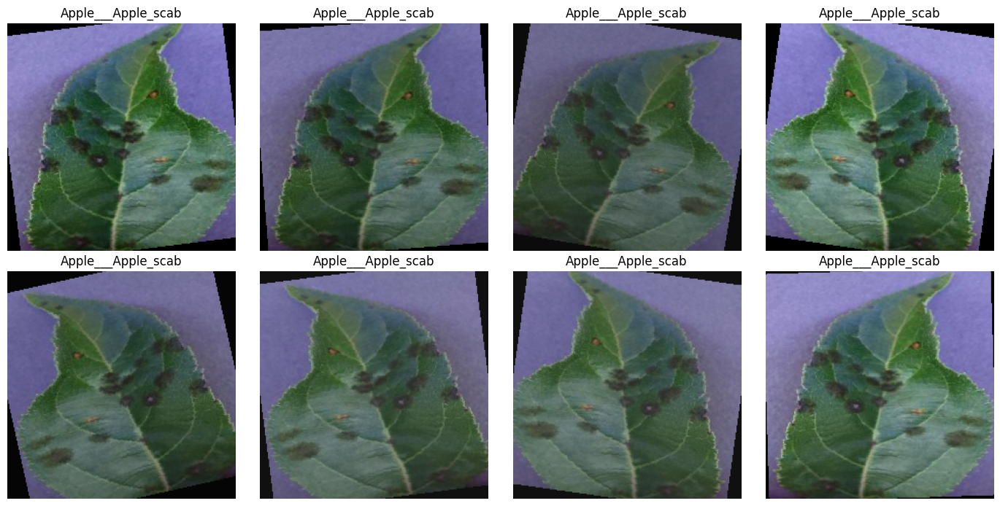

In [34]:
sample_index = 0

fig, axes = plt.subplots(2, 4, figsize=(14, 7))

for ax in axes.flat:

    image, label = train_dataset[sample_index]
    # Undo normalization for visualization
    image = image.permute(1, 2, 0)      # PyTorch tensor ka shape [Channels, Height, Width] but Matplotlib k plt.imshow() ko [Height, Width, Channels]
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    image = image * std + mean    # Matplotlib normalize hui image ko unnatural display karta hai. Is liye hum Normalization Formula ko reverse karte hain.
    image = torch.clamp(image, 0, 1)    #  strictly 0 aur 1 ke darmiyan restrict/lock karna

    ax.imshow(image)
    ax.set_title(train_dataset.classes[label])
    ax.axis("off")

plt.tight_layout()
plt.show()

# DATALOADERS

In [35]:
BATCH_SIZE = 32

train_loader = DataLoader(      # PyTorch ka streaming engine ; single samples collect karke mini-batches banata
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    # CPU ke 2 sub-threads background mein next batch load karte rehte hain jab tak GPU current batch par training kar raha hota hai.
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

In [36]:
print("Training batches:", len(train_loader))
print("Validation batches:", len(val_loader))

Training batches: 1358
Validation batches: 340


In [37]:
images, labels = next(iter(train_loader))   # Pehla batch fetch karta hai.

print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])


In [38]:
print("Labels:")
print(labels)

Labels:
tensor([19, 29, 13, 24, 14, 35, 16, 35, 20, 18, 10, 37, 15, 18,  4, 19, 15, 24,
        24, 24, 15, 16, 11, 25, 16, 31,  3, 20, 35, 16, 37, 27])


In [39]:
print(train_dataset.class_to_idx)

{'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Leaf_scorch': 26, 'Strawberry___healthy': 27, 'Tomato___Bacterial_spot': 28, 'Tomato___Early_blight': 29, 'Tomato___Late_blight': 30, 'Tomato

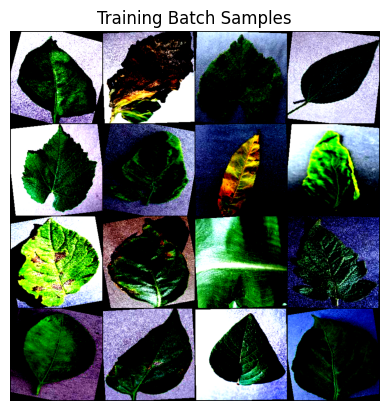

In [40]:
grid = make_grid(     # 16 alag image tensors ko 4 x 4 grid format mein combine kar ke ek akeli badi image matrix bana deta hai.
    images[:16],
    nrow=4
)
plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.title("Training Batch Samples")

plt.show()

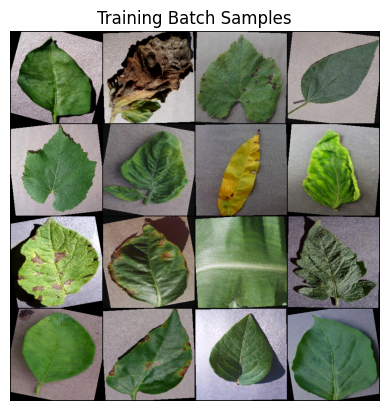

In [41]:
mean = torch.tensor(
    [0.485, 0.456, 0.406]
).view(3, 1, 1)         # 1D array [3] ko 3D shape [3, 1, 1] mein transform karta hai taake PyTorch ki Broadcasting 32 x 3 x 224 x 224 tensor par channels-wise Math run kar sake.

std = torch.tensor(
    [0.229, 0.224, 0.225]
).view(3, 1, 1)

images_display = images[:16] * std + mean       # Normalization formula ko reverse karke pixel values ko dobara [0.0, 1.0] standard RGB range mein convert kar deta hai.
images_display = torch.clamp(images_display, 0, 1)    #  strictly 0.0 aur 1.0 ke darmiyan limit kar deta hai

grid = make_grid(
    images_display,
    nrow=4
)

plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.title("Training Batch Samples")

plt.show()

# MODEL - Baseline CNN

In [42]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
print("Device:", device)

Device: cuda


In [43]:
num_classes = len(train_dataset.classes)
print("Number of classes:", num_classes)

Number of classes: 38


In [44]:
class PlantDiseaseCNN(nn.Module):

    def __init__(self, num_classes):
        super().__init__()
        self.features = nn.Sequential(    # image se visual patterns (edges, textures, plant leaf spots) extract karna
            # Block 1   ;  3 RGB channels --> 32 feature maps
            nn.Conv2d(in_channels=3, out_channels=32,  kernel_size=3, padding=1 ),nn.ReLU(), nn.MaxPool2d(kernel_size=2),
            # Block 2   ; 32 --> 64 feature maps
            nn.Conv2d(in_channels=32, out_channels=64,  kernel_size=3, padding=1 ),nn.ReLU(), nn.MaxPool2d(kernel_size=2),
            # Block 3   ; 64 --> 128 feature maps
            nn.Conv2d(in_channels=64, out_channels=128,  kernel_size=3, padding=1 ),nn.ReLU(), nn.MaxPool2d(kernel_size=2),
        )

        self.classifier = nn.Sequential(      # extracted features ki bunyaad par final leaf disease classification karna
                                        nn.Flatten(),     # 3D Feature tensor (128, 28, 28) ko 1D vector mein
                                        nn.Linear( 128 * 28 * 28, 256),     # Fully Connected layer jo 100,352 inputs ko 256 neurons ke saath connect karti hai.
                                        nn.ReLU(),
                                        nn.Dropout(0.5),      # Training ke waqt randomly 50% neurons ko turn off (zero) kar deta hai
                                        nn.Linear(256,num_classes))         # Final layer jo 38 output scores (logits) generate karti hai (har class ke liye 1 score).

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

Dimension Flow:

Input: (3, 224, 224)

After Block 1 MaxPool: (32, 112, 112)

After Block 2 MaxPool: (64, 56, 56)

After Block 3 MaxPool: (128, 28, 28)

In [45]:
model = PlantDiseaseCNN(
    num_classes=num_classes
)
model = model.to(device)
print(model)

PlantDiseaseCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=100352, out_features=256, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=256, out_features=38, bias=True)
  )
)


In [46]:
images, labels = next(iter(train_loader))
images = images.to(device)
outputs = model(images)

print("Input shape :", images.shape)
print("Output shape:", outputs.shape)

Input shape : torch.Size([32, 3, 224, 224])
Output shape: torch.Size([32, 38])


In [47]:
total_params = sum(
    p.numel()     # Tensor ke total individual scalar weight elements ki counting karta hai.
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad            # Check karta hai ke parameter trainable hai ya frozen
)

print("Total parameters:", f"{total_params:,}")
print("Trainable parameters:", f"{trainable_params:,}")

Total parameters: 25,793,382
Trainable parameters: 25,793,382


# BASELINE MODEL TRAINING

In [48]:
criterion = nn.CrossEntropyLoss()     # Classification problems ke liye use hota hai.
optimizer = optim.Adam(               # Model ke weights ko update karne ka engine hai.
    model.parameters(),
    lr=0.001
)

EPOCHS = 10

train_losses = []
val_losses = []

train_accuracies = []
val_accuracies = []
best_val_accuracy = 0.0

for epoch in range(EPOCHS):
    # TRAINING
    model.train()
    # Training se pehle model.train() likhna mandatory hai. Yeh Dropout layers aur Batch Normalization layers ko active (training mode par) kar deta hai

    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()       # Purane batch k calculate kiye gaye gradients ko zero/clear karta hai.

        outputs = model(images)     # Forward Pass. Images model se guzarti hain aur predictions banti hain.

        loss = criterion(outputs, labels)     # Model ke error (Loss) ki value calculate hoti hai.

        # Backpropagation
        loss.backward()             # Automatic differentiation se calculate hota hai ke kis weight ki kitni ghalti thi.

        optimizer.step()            # Adam optimizer weights ko update kar ke model ko thoda behtar bana deta hai.

        # Statistics
        running_train_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)        # Matrix mein horiz axis (1) pr check krta k 38 classes mein sbse bri val(highest confidence score) kis index par

        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()


    epoch_train_loss = (
        running_train_loss / total_train
    )

    epoch_train_accuracy = (
        100 * correct_train / total_train
    )


    # VALIDATION
    model.eval()          # Model ko Evaluation mode par switch kar deta hai (Dropout ko temporary DISABLE kar deta hai).

    running_val_loss = 0.0
    correct_val = 0
    total_val = 0

    with torch.no_grad():         # PyTorch ko order deta hai ke computation graph aur gradients calculate Nahi karne.

        for images, labels in val_loader:

            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Calculate loss
            loss = criterion(outputs, labels)

            running_val_loss += (
                loss.item() * images.size(0)
            )

            _, predicted = torch.max(outputs, 1)

            total_val += labels.size(0)
            correct_val += (
                predicted == labels
            ).sum().item()


    epoch_val_loss = (
        running_val_loss / total_val
    )

    epoch_val_accuracy = (
        100 * correct_val / total_val
    )

    # SAVE METRICS
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)

    train_accuracies.append(epoch_train_accuracy)
    val_accuracies.append(epoch_val_accuracy)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"| Train Loss: {epoch_train_loss:.4f} "
        f"| Train Acc: {epoch_train_accuracy:.2f}% "
        f"| Val Loss: {epoch_val_loss:.4f} "
        f"| Val Acc: {epoch_val_accuracy:.2f}%"
    )

Epoch [1/10] | Train Loss: 1.3562 | Train Acc: 61.03% | Val Loss: 0.5697 | Val Acc: 82.29%
Epoch [2/10] | Train Loss: 0.7540 | Train Acc: 76.97% | Val Loss: 0.3395 | Val Acc: 89.31%
Epoch [3/10] | Train Loss: 0.5651 | Train Acc: 82.63% | Val Loss: 0.2819 | Val Acc: 91.12%
Epoch [4/10] | Train Loss: 0.4583 | Train Acc: 85.75% | Val Loss: 0.2170 | Val Acc: 93.32%
Epoch [5/10] | Train Loss: 0.4079 | Train Acc: 87.31% | Val Loss: 0.2236 | Val Acc: 92.96%
Epoch [6/10] | Train Loss: 0.3706 | Train Acc: 88.44% | Val Loss: 0.1969 | Val Acc: 94.01%
Epoch [7/10] | Train Loss: 0.3350 | Train Acc: 89.65% | Val Loss: 0.1492 | Val Acc: 95.12%
Epoch [8/10] | Train Loss: 0.3159 | Train Acc: 90.25% | Val Loss: 0.1374 | Val Acc: 95.67%
Epoch [9/10] | Train Loss: 0.2902 | Train Acc: 90.91% | Val Loss: 0.1712 | Val Acc: 94.73%
Epoch [10/10] | Train Loss: 0.2803 | Train Acc: 91.27% | Val Loss: 0.1552 | Val Acc: 94.82%


In [49]:
if epoch_val_accuracy > best_val_accuracy:

    best_val_accuracy = epoch_val_accuracy

    torch.save(
        model.state_dict(),
        "/content/drive/MyDrive/plantvillage_best_model.pth"
    )

    print("Best model saved!")

Best model saved!


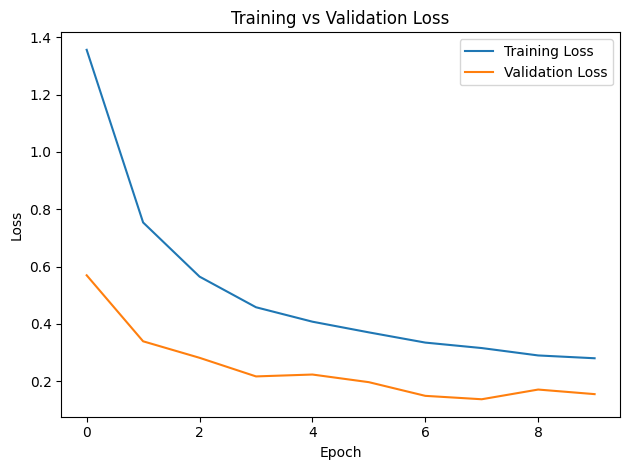

In [50]:
plt.plot(
    train_losses,
    label="Training Loss"
)

plt.plot(
    val_losses,
    label="Validation Loss"
)

plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

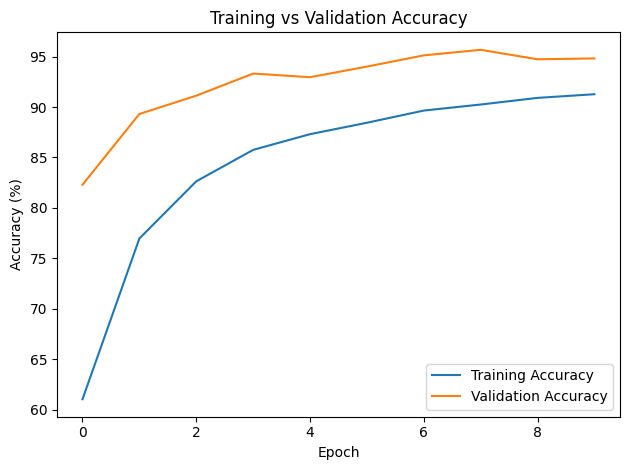

In [51]:
plt.plot(
    train_accuracies,
    label="Training Accuracy"
)

plt.plot(
    val_accuracies,
    label="Validation Accuracy"
)

plt.title("Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()

plt.tight_layout()
plt.show()

In [52]:
best_val_accuracy = max(val_accuracies)

best_epoch = (
    val_accuracies.index(best_val_accuracy) + 1
)

print(
    f"Best Validation Accuracy: "
    f"{best_val_accuracy:.2f}%"
)

print(
    f"Best Epoch: {best_epoch}"
)

Best Validation Accuracy: 95.67%
Best Epoch: 8


# BASELINE MODEL EVALUATION

In [53]:
model.eval()

all_labels = []
all_predictions = []

# Ensure we use val_loader directly
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, dim=1)

        # Use list extend with scalar items
        all_labels.extend(labels.cpu().tolist())
        all_predictions.extend(preds.cpu().tolist())

# Accuracy check
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(all_labels, all_predictions)
print(f"Corrected Validation Accuracy: {accuracy * 100:.2f}%")

Corrected Validation Accuracy: 94.82%


In [54]:
print(
    classification_report(
        all_labels,
        all_predictions,
        target_names=train_dataset.classes
    )
)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.72      0.94      0.81       126
                                 Apple___Black_rot       0.95      0.94      0.94       125
                          Apple___Cedar_apple_rust       0.96      0.98      0.97        55
                                   Apple___healthy       0.99      0.94      0.96       329
                               Blueberry___healthy       0.96      0.98      0.97       300
          Cherry_(including_sour)___Powdery_mildew       0.99      0.98      0.98       210
                 Cherry_(including_sour)___healthy       0.88      0.98      0.93       170
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.86      0.67      0.75       103
                       Corn_(maize)___Common_rust_       0.98      1.00      0.99       239
               Corn_(maize)___Northern_Leaf_Blight       0.83      0.92      0.

In [55]:
report = classification_report(
    all_labels,
    all_predictions,
    target_names=train_dataset.classes,
    output_dict=True
)

report_df = pd.DataFrame(report).transpose()

report_df

,precision,recall,f1-score,support
Apple___Apple_scab,0.715152,0.936508,0.810997,126.000000
Apple___Black_rot,0.951220,0.936000,0.943548,125.000000
Apple___Cedar_apple_rust,0.964286,0.981818,0.972973,55.000000
Apple___healthy,0.987179,0.936170,0.960998,329.000000
Blueberry___healthy,0.960912,0.983333,0.971993,300.000000
Cherry_(including_sour)___Powdery_mildew,0.985646,0.980952,0.983294,210.000000
Cherry_(including_sour)___healthy,0.883598,0.982353,0.930362,170.000000
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,0.862500,0.669903,0.754098,103.000000
Corn_(maize)___Common_rust_,0.975510,1.000000,0.987603,239.000000
Corn_(maize)___Northern_Leaf_Blight,0.830275,0.918782,0.872289,197.000000


In [56]:
report_df.sort_values(
    "f1-score",
    ascending=False
).head(10)

,precision,recall,f1-score,support
Tomato___healthy,1.000000,0.993711,0.996845,318.0
Squash___Powdery_mildew,1.000000,0.983651,0.991758,367.0
Orange___Haunglongbing_(Citrus_greening),0.984753,0.996370,0.990528,1102.0
Strawberry___Leaf_scorch,0.990950,0.986486,0.988713,222.0
Corn_(maize)___Common_rust_,0.975510,1.000000,0.987603,239.0
Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.982440,0.992530,0.987459,1071.0
Corn_(maize)___healthy,0.974895,1.000000,0.987288,233.0
Peach___healthy,0.986111,0.986111,0.986111,72.0
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.995261,0.976744,0.985915,215.0
Cherry_(including_sour)___Powdery_mildew,0.985646,0.980952,0.983294,210.0


In [57]:
report_df.sort_values(
    "f1-score",
    ascending=False
).head(10)

,precision,recall,f1-score,support
Tomato___healthy,1.000000,0.993711,0.996845,318.0
Squash___Powdery_mildew,1.000000,0.983651,0.991758,367.0
Orange___Haunglongbing_(Citrus_greening),0.984753,0.996370,0.990528,1102.0
Strawberry___Leaf_scorch,0.990950,0.986486,0.988713,222.0
Corn_(maize)___Common_rust_,0.975510,1.000000,0.987603,239.0
Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.982440,0.992530,0.987459,1071.0
Corn_(maize)___healthy,0.974895,1.000000,0.987288,233.0
Peach___healthy,0.986111,0.986111,0.986111,72.0
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.995261,0.976744,0.985915,215.0
Cherry_(including_sour)___Powdery_mildew,0.985646,0.980952,0.983294,210.0


In [58]:
cm = confusion_matrix(
    all_labels,
    all_predictions
)

print(cm.shape)

(38, 38)


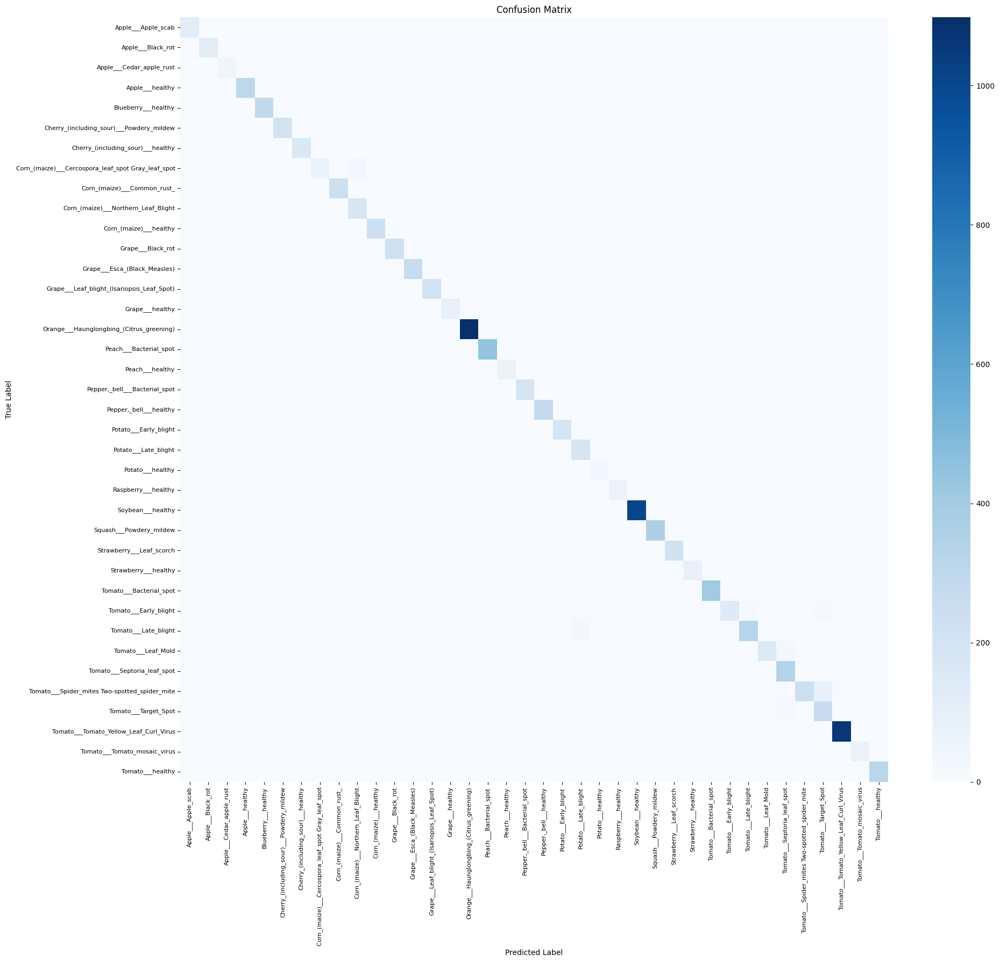

In [59]:
plt.figure(figsize=(20, 18))

sns.heatmap(
    cm,
    annot=False,
    cmap="Blues",
    xticklabels=train_dataset.classes,
    yticklabels=train_dataset.classes
)

plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.xticks(
    rotation=90,
    fontsize=8
)

plt.yticks(
    rotation=0,
    fontsize=8
)

plt.tight_layout()
plt.show()

In [60]:
confusions = []

for i in range(len(cm)):
    for j in range(len(cm)):

        if i != j and cm[i, j] > 0:

            confusions.append({
                "Actual": train_dataset.classes[i],
                "Predicted": train_dataset.classes[j],
                "Count": cm[i, j]
            })

confusion_df = pd.DataFrame(confusions)

confusion_df = confusion_df.sort_values(
    "Count",
    ascending=False
)

confusion_df.head(15)

,Actual,Predicted,Count
149,Tomato___Spider_mites Two-spotted_spider_mite,Tomato___Target_Spot,85
28,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,Corn_(maize)___Northern_Leaf_Blight,34
136,Tomato___Leaf_Mold,Tomato___Septoria_leaf_spot,27
130,Tomato___Late_blight,Potato___Late_blight,24
155,Tomato___Target_Spot,Tomato___Septoria_leaf_spot,20
115,Tomato___Early_blight,Tomato___Late_blight,16
117,Tomato___Early_blight,Tomato___Target_Spot,15
45,Peach___Bacterial_spot,Apple___Apple_scab,11
135,Tomato___Leaf_Mold,Apple___Apple_scab,11
29,Corn_(maize)___Northern_Leaf_Blight,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,11


In [61]:
correct_indices = [
    i
    for i in range(len(all_labels))
    if all_labels[i] == all_predictions[i]
]

print("Correct predictions:", len(correct_indices))

Correct predictions: 10298


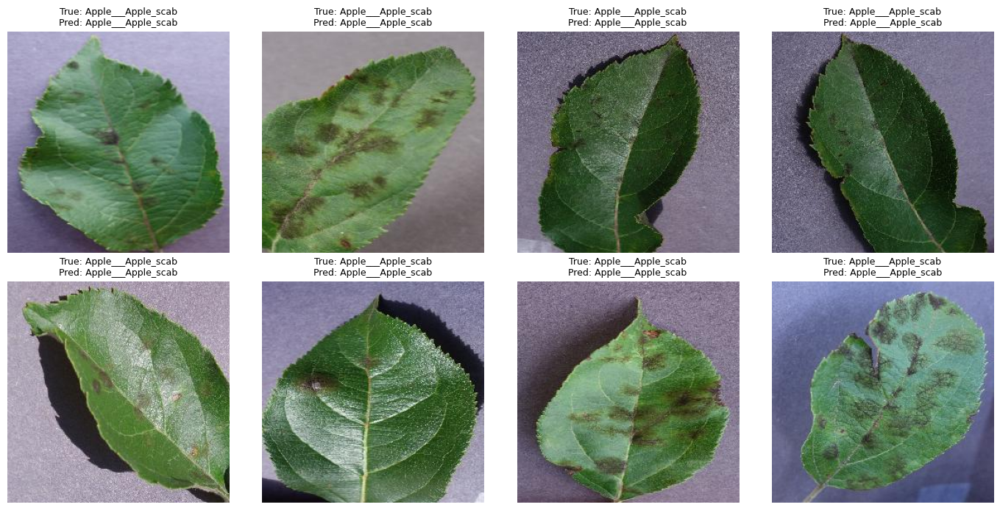

In [62]:
fig, axes = plt.subplots(
    2, 4,
    figsize=(14, 7)
)

for ax, idx in zip(
    axes.flat,
    correct_indices[:8]
):

    image_path, true_label = val_dataset.samples[idx]

    image = Image.open(image_path)

    predicted_label = all_predictions[idx]

    ax.imshow(image)

    ax.set_title(
        f"True: {train_dataset.classes[true_label]}\n"
        f"Pred: {train_dataset.classes[predicted_label]}",
        fontsize=9
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [63]:
incorrect_indices = [
    i
    for i in range(len(all_labels))
    if all_labels[i] != all_predictions[i]
]

print("Incorrect predictions:", len(incorrect_indices))

Incorrect predictions: 563


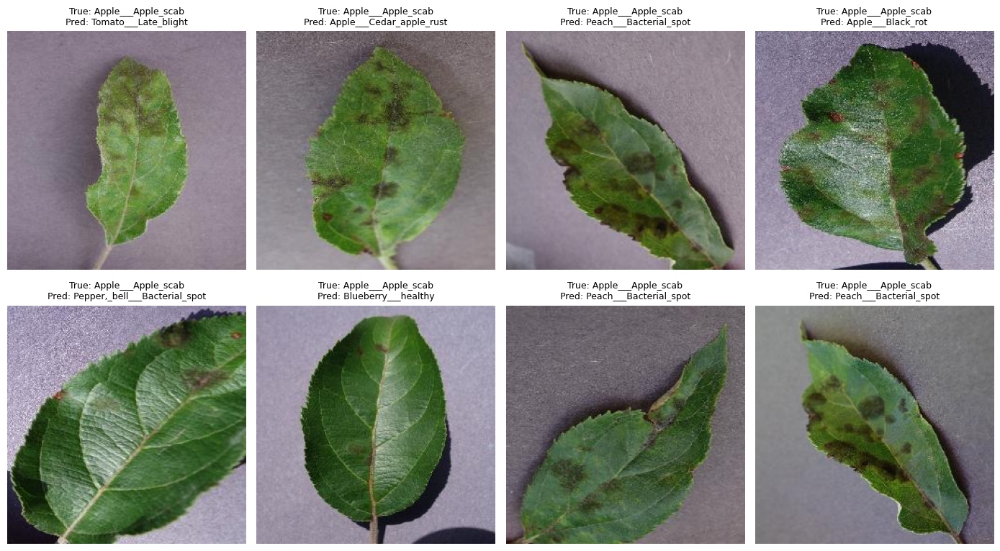

In [64]:
fig, axes = plt.subplots(
    2, 4,
    figsize=(14, 8)
)

for ax, idx in zip(
    axes.flat,
    incorrect_indices[:8]
):

    image_path, true_label = val_dataset.samples[idx]

    image = Image.open(image_path)

    predicted_label = all_predictions[idx]

    ax.imshow(image)

    ax.set_title(
        f"True: {train_dataset.classes[true_label]}\n"
        f"Pred: {train_dataset.classes[predicted_label]}",
        fontsize=9
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [65]:
print("MODEL EVALUATION:")

print(
    f"Validation Accuracy : "
    f"{accuracy * 100:.2f}%"
)

print(
    f"Correct Predictions : "
    f"{len(correct_indices)}"
)

print(
    f"Incorrect Predictions : "
    f"{len(incorrect_indices)}"
)

print(
    f"Total Validation Images : "
    f"{len(all_labels)}"
)

MODEL EVALUATION:
Validation Accuracy : 94.82%
Correct Predictions : 10298
Incorrect Predictions : 563
Total Validation Images : 10861


# TRANSFER LEARNING - ResNet18

ResNet18 (pre-trained on ImageNet) ko apne Plant Disease dataset par Fine-Tune kar rahe hain

In [66]:
resnet_model = models.resnet18(
    weights=models.ResNet18_Weights.DEFAULT
)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 203MB/s]


In [67]:
num_classes = len(train_dataset.classes) # 1000 classes wala classification head ko 38 classes se replace

resnet_model.fc = nn.Linear(
    resnet_model.fc.in_features,
    num_classes
)
print(resnet_model.fc)

Linear(in_features=512, out_features=38, bias=True)


In [68]:
resnet_model = resnet_model.to(device)

In [69]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    resnet_model.parameters(),
    lr=0.0001
)
# Transfer learning mein pre-trained weights ko safe rakhne ke liye chota learning rate
# use kiya jata hai taake model fine-tuning ke dauran purani learning disturb na kare.

In [70]:
images, labels = next(iter(train_loader))

images = images.to(device)

outputs = resnet_model(images)

print("Input shape :", images.shape)
print("Output shape:", outputs.shape)

Input shape : torch.Size([32, 3, 224, 224])
Output shape: torch.Size([32, 38])


In [ ]:
EPOCHS = 10

resnet_train_losses = []
resnet_val_losses = []

resnet_train_accuracies = []
resnet_val_accuracies = []

best_val_accuracy = 0.0

for epoch in range(EPOCHS):

    # TRAIN
    resnet_model.train()

    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = resnet_model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_train_loss += (
            loss.item() * images.size(0)
        )

        _, predicted = torch.max(outputs, 1)

        total_train += labels.size(0)

        correct_train += (
            predicted == labels
        ).sum().item()

    train_loss = (
        running_train_loss / total_train
    )

    train_accuracy = (
        100 * correct_train / total_train
    )

    # VALIDATION
    resnet_model.eval()

    running_val_loss = 0.0
    correct_val = 0
    total_val = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = resnet_model(images)

            loss = criterion(outputs, labels)

            running_val_loss += (
                loss.item() * images.size(0)
            )

            _, predicted = torch.max(outputs, 1)

            total_val += labels.size(0)

            correct_val += (
                predicted == labels
            ).sum().item()

    val_loss = (
        running_val_loss / total_val
    )

    val_accuracy = (
        100 * correct_val / total_val
    )

    # SAVE METRICS
    resnet_train_losses.append(train_loss)
    resnet_val_losses.append(val_loss)

    resnet_train_accuracies.append(train_accuracy)
    resnet_val_accuracies.append(val_accuracy)

    # SAVE BEST MODEL
    if val_accuracy > best_val_accuracy:

        best_val_accuracy = val_accuracy

        torch.save(
            resnet_model.state_dict(),
            "/content/drive/MyDrive/plantvillage_resnet18_best.pth"
        )

        saved = "Best model saved"

    else:
        saved = ""

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"| Train Loss: {train_loss:.4f} "
        f"| Train Acc: {train_accuracy:.2f}% "
        f"| Val Loss: {val_loss:.4f} "
        f"| Val Acc: {val_accuracy:.2f}%"
        f"{saved}"
    )

Epoch [1/10] | Train Loss: 0.2197 | Train Acc: 94.62% | Val Loss: 0.0455 | Val Acc: 98.59%Best model saved
Epoch [2/10] | Train Loss: 0.0462 | Train Acc: 98.69% | Val Loss: 0.0490 | Val Acc: 98.43%
Epoch [3/10] | Train Loss: 0.0344 | Train Acc: 98.98% | Val Loss: 0.0632 | Val Acc: 98.07%
Epoch [4/10] | Train Loss: 0.0272 | Train Acc: 99.19% | Val Loss: 0.0250 | Val Acc: 99.22%Best model saved
Epoch [5/10] | Train Loss: 0.0260 | Train Acc: 99.18% | Val Loss: 0.0193 | Val Acc: 99.30%Best model saved
Epoch [6/10] | Train Loss: 0.0247 | Train Acc: 99.24% | Val Loss: 0.0191 | Val Acc: 99.47%Best model saved
Epoch [7/10] | Train Loss: 0.0173 | Train Acc: 99.46% | Val Loss: 0.0174 | Val Acc: 99.48%Best model saved


In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    resnet_train_accuracies,
    label="Train Accuracy"
)

plt.plot(
    resnet_val_accuracies,
    label="Validation Accuracy"
)

plt.title("ResNet18 Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    resnet_train_losses,
    label="Train Loss"
)

plt.plot(
    resnet_val_losses,
    label="Validation Loss"
)

plt.title("ResNet18 Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
print(
    f"Custom CNN Best Accuracy : "
    f"{max(val_accuracies):.2f}%"
)

print(
    f"ResNet18 Best Accuracy   : "
    f"{max(resnet_val_accuracies):.2f}%"
)

# ResNet18 Model Evaluation

In [ ]:
best_model_path = "/content/drive/MyDrive/plantvillage_resnet18_best.pth"

resnet_model.load_state_dict(
    torch.load(
        best_model_path,
        map_location=device
    )
)

resnet_model = resnet_model.to(device)
resnet_model.eval()

print("Best ResNet18 model loaded.")

In [ ]:
all_labels_resnet = []
all_predictions_resnet = []

resnet_model.eval()

with torch.no_grad():

    for images, labels in val_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = resnet_model(images)

        _, predictions = torch.max(outputs, 1)

        all_labels_resnet.extend(
            labels.cpu().numpy()
        )

        all_predictions_resnet.extend(
            predictions.cpu().numpy()
        )

print(
    "Total validation samples:",
    len(all_labels_resnet)
)

In [ ]:
from sklearn.metrics import accuracy_score

resnet_accuracy = accuracy_score(
    all_labels_resnet,
    all_predictions_resnet
)

print(
    f"ResNet18 Validation Accuracy: "
    f"{resnet_accuracy * 100:.2f}%"
)

In [ ]:
resnet_report = classification_report(
    all_labels_resnet,
    all_predictions_resnet,
    target_names=train_dataset.classes
)

print(resnet_report)

In [ ]:
resnet_report_dict = classification_report(
    all_labels_resnet,
    all_predictions_resnet,
    target_names=train_dataset.classes,
    output_dict=True
)

resnet_report_df = pd.DataFrame(
    resnet_report_dict
).transpose()

resnet_report_df

In [ ]:
resnet_report_df.sort_values(
    "f1-score"
).head(10)

In [ ]:
resnet_report_df.sort_values(
    "f1-score",
    ascending=False
).head(10)

In [ ]:
cm_resnet = confusion_matrix(
    all_labels_resnet,
    all_predictions_resnet
)

print("Confusion Matrix Shape:", cm_resnet.shape)

In [ ]:
plt.figure(figsize=(20, 18))

sns.heatmap(
    cm_resnet,
    annot=False,
    cmap="Blues",
    xticklabels=train_dataset.classes,
    yticklabels=train_dataset.classes
)

plt.title("ResNet18 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.xticks(
    rotation=90,
    fontsize=8
)

plt.yticks(
    rotation=0,
    fontsize=8
)

plt.tight_layout()
plt.show()

In [ ]:
resnet_confusions = []

for i in range(len(cm_resnet)):

    for j in range(len(cm_resnet)):

        if i != j and cm_resnet[i, j] > 0:

            resnet_confusions.append({
                "Actual": train_dataset.classes[i],
                "Predicted": train_dataset.classes[j],
                "Count": cm_resnet[i, j]
            })

resnet_confusion_df = pd.DataFrame(
    resnet_confusions
)

resnet_confusion_df = resnet_confusion_df.sort_values(
    "Count",
    ascending=False
)

resnet_confusion_df.head(15)

In [ ]:
correct_resnet = [
    i
    for i in range(len(all_labels_resnet))
    if all_labels_resnet[i] == all_predictions_resnet[i]
]

incorrect_resnet = [
    i
    for i in range(len(all_labels_resnet))
    if all_labels_resnet[i] != all_predictions_resnet[i]
]

print("Correct predictions:", len(correct_resnet))
print("Incorrect predictions:", len(incorrect_resnet))

In [ ]:
fig, axes = plt.subplots(
    2, 4,
    figsize=(14, 8)
)

for ax, idx in zip(
    axes.flat,
    incorrect_resnet[:8]
):

    image_path, true_label = val_dataset.samples[idx]

    image = Image.open(image_path)

    predicted_label = all_predictions_resnet[idx]

    ax.imshow(image)

    ax.set_title(
        f"True: {train_dataset.classes[true_label]}\n"
        f"Pred: {train_dataset.classes[predicted_label]}",
        fontsize=9
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
print("RESNET18 EVALUATION")

print(
    f"Accuracy: "
    f"{resnet_accuracy * 100:.2f}%"
)

print(
    f"Correct Predictions: "
    f"{len(correct_resnet)}"
)

print(
    f"Incorrect Predictions: "
    f"{len(incorrect_resnet)}"
)

print(
    f"Total Validation Images: "
    f"{len(all_labels_resnet)}"
)

In [ ]:
comparison = pd.DataFrame({
    "Model": [
        "Custom CNN",
        "ResNet18"
    ],
    "Best Validation Accuracy": [
        max(val_accuracies),
        max(resnet_val_accuracies)
    ]
})

comparison

In [ ]:
plt.figure(figsize=(8, 5))

sns.barplot(
    data=comparison,
    x="Model",
    y="Best Validation Accuracy"
)

plt.title("Custom CNN vs ResNet18")
plt.ylabel("Validation Accuracy (%)")
plt.ylim(0, 100)

plt.tight_layout()
plt.show()

# ERROR ANALYSIS

In [ ]:
resnet_confusions = []

for i in range(len(cm_resnet)):

    for j in range(len(cm_resnet)):

        if i != j and cm_resnet[i, j] > 0:

            resnet_confusions.append({
                "Actual": train_dataset.classes[i],
                "Predicted": train_dataset.classes[j],
                "Count": cm_resnet[i, j]
            })

resnet_confusion_df = pd.DataFrame(
    resnet_confusions
)

resnet_confusion_df = resnet_confusion_df.sort_values(
    "Count",
    ascending=False
)

print("Most Confused Class Pairs:")
display(resnet_confusion_df.head(15))

In [ ]:
num_images = min(12, len(incorrect_resnet))

fig, axes = plt.subplots(
    3,
    4,
    figsize=(16, 12)
)

axes = axes.flatten()

for ax in axes:
    ax.axis("off")

for ax, idx in zip(
    axes,
    incorrect_resnet[:num_images]
):

    image_path, true_label = val_dataset.samples[idx]

    image = Image.open(image_path).convert("RGB")

    predicted_label = all_predictions_resnet[idx]

    ax.imshow(image)

    ax.set_title(
        f"True: {train_dataset.classes[true_label]}\n"
        f"Pred: {train_dataset.classes[predicted_label]}",
        fontsize=9
    )

    ax.axis("off")

plt.suptitle(
    "ResNet18 Misclassified Images",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [ ]:
class_errors = []

for i, class_name in enumerate(train_dataset.classes):

    actual_count = sum(
        label == i
        for label in all_labels_resnet
    )

    correct_count = sum(
        (actual == i and predicted == i)
        for actual, predicted
        in zip(
            all_labels_resnet,
            all_predictions_resnet
        )
    )

    error_count = actual_count - correct_count

    class_errors.append({
        "Class": class_name,
        "Total": actual_count,
        "Correct": correct_count,
        "Errors": error_count
    })

class_errors_df = pd.DataFrame(class_errors)

class_errors_df = class_errors_df.sort_values(
    "Errors",
    ascending=False
)

display(class_errors_df.head(10))

In [ ]:
all_probabilities = []

resnet_model.eval()

with torch.no_grad():

    for images, labels in val_loader:

        images = images.to(device)

        outputs = resnet_model(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        all_probabilities.extend(
            probabilities.cpu().numpy()
        )

all_probabilities = np.array(
    all_probabilities
)

In [ ]:
wrong_confidence = []

for idx in incorrect_resnet:

    predicted_class = all_predictions_resnet[idx]

    confidence = all_probabilities[
        idx,
        predicted_class
    ]

    wrong_confidence.append({
        "Index": idx,
        "True": train_dataset.classes[
            all_labels_resnet[idx]
        ],
        "Predicted": train_dataset.classes[
            predicted_class
        ],
        "Confidence": confidence
    })

wrong_confidence_df = pd.DataFrame(
    wrong_confidence
)

wrong_confidence_df = wrong_confidence_df.sort_values(
    "Confidence",
    ascending=False
)

display(wrong_confidence_df)

# CONFIDENCE CALIBRATION

In [ ]:
all_probabilities = np.array(all_probabilities)

In [ ]:
print("Probability shape:", all_probabilities.shape)
print("Number of predictions:", len(all_predictions_resnet))

In [ ]:
confidence_scores = np.max(
    all_probabilities,
    axis=1
)

print("First 10 confidence scores:")
print(confidence_scores[:10])

In [ ]:
predicted_classes = np.argmax(
    all_probabilities,
    axis=1
)

In [ ]:
print(
    np.array_equal(
        predicted_classes,
        np.array(all_predictions_resnet)
    )
)

In [ ]:
correct_mask = (
    np.array(all_labels_resnet)
    == np.array(all_predictions_resnet)
)

incorrect_mask = ~correct_mask

correct_confidence = confidence_scores[
    correct_mask
]

incorrect_confidence = confidence_scores[
    incorrect_mask
]

print(
    f"Average confidence — Correct: "
    f"{correct_confidence.mean():.4f}"
)

print(
    f"Average confidence — Incorrect: "
    f"{incorrect_confidence.mean():.4f}"
)

In [ ]:
plt.figure(figsize=(9, 5))

plt.hist(
    correct_confidence,
    bins=20,
    alpha=0.7,
    label="Correct"
)

plt.hist(
    incorrect_confidence,
    bins=20,
    alpha=0.7,
    label="Incorrect"
)

plt.xlabel("Prediction Confidence")
plt.ylabel("Number of Images")
plt.title("ResNet18 Confidence Distribution")

plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.calibration import calibration_curve
prob_true, prob_pred = calibration_curve(
    correct_mask.astype(int),
    confidence_scores,
    n_bins=10,
    strategy="uniform"
)
plt.figure(figsize=(7, 7))
plt.plot(
    prob_pred,
    prob_true,
    marker="o",
    label="ResNet18"
)
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Perfect Calibration"
)
plt.xlabel("Mean Predicted Confidence")
plt.ylabel("Fraction of Correct Predictions")
plt.title("ResNet18 Reliability Diagram")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
def expected_calibration_error(
    confidence,
    correct,
    n_bins=10
):

    bin_boundaries = np.linspace(
        0,
        1,
        n_bins + 1
    )

    ece = 0.0

    for i in range(n_bins):

        lower = bin_boundaries[i]
        upper = bin_boundaries[i + 1]

        if i == n_bins - 1:
            mask = (
                (confidence >= lower) &
                (confidence <= upper)
            )
        else:
            mask = (
                (confidence >= lower) &
                (confidence < upper)
            )

        if np.sum(mask) == 0:
            continue

        bin_accuracy = np.mean(
            correct[mask]
        )

        bin_confidence = np.mean(
            confidence[mask]
        )

        bin_size = np.sum(mask)

        ece += (
            bin_size / len(confidence)
        ) * abs(
            bin_accuracy -
            bin_confidence
        )

    return ece

In [ ]:
ece = expected_calibration_error(
    confidence_scores,
    correct_mask,
    n_bins=10
)

print(
    f"Expected Calibration Error (ECE): "
    f"{ece:.4f}"
)

In [ ]:
confidence_bins = pd.DataFrame({
    "Confidence": confidence_scores,
    "Correct": correct_mask
})

confidence_bins["Bin"] = pd.cut(
    confidence_bins["Confidence"],
    bins=np.linspace(0, 1, 11),
    include_lowest=True
)

calibration_table = (
    confidence_bins
    .groupby("Bin", observed=True)
    .agg(
        Mean_Confidence=("Confidence", "mean"),
        Accuracy=("Correct", "mean"),
        Samples=("Correct", "count")
    )
)

calibration_table["Gap"] = (
    calibration_table["Mean_Confidence"]
    - calibration_table["Accuracy"]
)

calibration_table

In [ ]:
print("CONFIDENCE CALIBRATION")

print(
    f"Validation Accuracy: "
    f"{resnet_accuracy * 100:.2f}%"
)

print(
    f"Average Correct Confidence: "
    f"{correct_confidence.mean() * 100:.2f}%"
)

print(
    f"Average Incorrect Confidence: "
    f"{incorrect_confidence.mean() * 100:.2f}%"
)

print(
    f"Expected Calibration Error: "
    f"{ece:.4f}"
)

In [ ]:
final_model_path = "/content/drive/MyDrive/plantvillage_resnet18_final.pth"

torch.save(
    resnet_model.state_dict(),
    final_model_path
)

print("Model saved successfully!")
print("Path:", final_model_path)

In [ ]:
import os

print(
    "File exists:",
    os.path.exists(final_model_path)
)

if os.path.exists(final_model_path):
    print(
        f"Model size: "
        f"{os.path.getsize(final_model_path) / (1024**2):.2f} MB"
    )

# NEW IMAGE PREDICTION

In [ ]:
new_image_path = "/content/drive/MyDrive/plant_images/my_leaf.jpg"

In [ ]:
resnet_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/plantvillage_resnet18_final.pth",
        map_location=device
    )
)

resnet_model = resnet_model.to(device)
resnet_model.eval()

print("Best ResNet18 model loaded successfully!")

In [ ]:
from torchvision import transforms

inference_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
from PIL import Image
import torch.nn.functional as F

def predict_image(image_path, model, class_names, transform, device):

    # Load image
    image = Image.open(image_path).convert("RGB")

    # Preprocess
    image_tensor = transform(image)

    # Add batch dimension
    image_tensor = image_tensor.unsqueeze(0)

    # Move to GPU/CPU
    image_tensor = image_tensor.to(device)

    # Prediction
    model.eval()

    with torch.no_grad():

        outputs = model(image_tensor)

        probabilities = F.softmax(
            outputs,
            dim=1
        )

        confidence, predicted_class = torch.max(
            probabilities,
            dim=1
        )

    predicted_label = class_names[
        predicted_class.item()
    ]

    confidence_percentage = (
        confidence.item() * 100
    )

    return (
        image,
        predicted_label,
        confidence_percentage,
        probabilities
    )

In [ ]:
image, predicted_label, confidence, probabilities = predict_image(
    new_image_path,
    resnet_model,
    train_dataset.classes,
    inference_transform,
    device
)

print("Predicted Disease:", predicted_label)
print(f"Confidence: {confidence:.2f}%")

In [ ]:
plt.figure(figsize=(7, 7))

plt.imshow(image)

plt.title(
    f"Prediction: {predicted_label}\n"
    f"Confidence: {confidence:.2f}%",
    fontsize=14
)

plt.axis("off")

plt.show()

In [ ]:
top5_probabilities, top5_indices = torch.topk(
    probabilities,
    k=5,
    dim=1
)

print("\nTOP 5 PREDICTIONS")

for rank, (prob, idx) in enumerate(
    zip(
        top5_probabilities[0],
        top5_indices[0]
    ),
    start=1
):

    class_name = train_dataset.classes[
        idx.item()
    ]

    probability = prob.item() * 100

    print(
        f"{rank}. {class_name}: "
        f"{probability:.2f}%"
    )

# FINAL MODEL COMPARISON

In [ ]:
final_results = pd.DataFrame({
    "Model": [
        "Custom CNN",
        "ResNet18"
    ],
    "Validation Accuracy (%)": [
        max(val_accuracies),
        max(resnet_val_accuracies)
    ]
})

final_results

In [ ]:
custom_acc = max(val_accuracies)
resnet_acc = max(resnet_val_accuracies)

improvement = resnet_acc - custom_acc

print(f"Custom CNN Accuracy : {custom_acc:.2f}%")
print(f"ResNet18 Accuracy   : {resnet_acc:.2f}%")
print(f"Improvement         : {improvement:.2f} percentage points")

In [ ]:
plt.figure(figsize=(8, 5))

bars = plt.bar(
    final_results["Model"],
    final_results["Validation Accuracy (%)"]
)

plt.title("Final Model Comparison")
plt.xlabel("Model")
plt.ylabel("Validation Accuracy (%)")
plt.ylim(0, 100)

for bar, value in zip(
    bars,
    final_results["Validation Accuracy (%)"]
):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.5,
        f"{value:.2f}%",
        ha="center",
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

In [ ]:
print("        FINAL MODEL PERFORMANCE")
print(f"Model                  : ResNet18")
print(f"Validation Accuracy    : {resnet_accuracy * 100:.2f}%")
print(f"Average Correct Conf.  : {correct_confidence.mean() * 100:.2f}%")
print(f"Average Incorrect Conf: {incorrect_confidence.mean() * 100:.2f}%")
print(f"Expected Calibration Error: {ece:.4f}")
print(f"Model Size             : 42.79 MB")

In [ ]:
import json

class_names = train_dataset.classes

class_names_path = (
    "/content/drive/MyDrive/"
    "plantvillage_class_names.json"
)

with open(class_names_path, "w") as f:
    json.dump(class_names, f, indent=4)

print("Class names saved successfully!")
print(class_names_path)

In [ ]:
metadata = {
    "model": "ResNet18",
    "num_classes": len(class_names),
    "image_size": 224,
    "validation_accuracy": float(resnet_accuracy * 100),
    "best_validation_accuracy": float(
        max(resnet_val_accuracies)
    ),
    "ece": float(ece),
    "classes": class_names
}

metadata_path = (
    "/content/drive/MyDrive/"
    "plantvillage_model_metadata.json"
)

with open(metadata_path, "w") as f:
    json.dump(metadata, f, indent=4)

print("Metadata saved successfully!")

# Inference for UI

In [ ]:
!pip install -q gradio

In [ ]:
import json
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image

In [ ]:
model_path = "/content/drive/MyDrive/plantvillage_resnet18_final.pth"
class_names_path = "/content/drive/MyDrive/plantvillage_class_names.json"

# Load class names dynamically
with open(class_names_path, "r") as f:
    class_names = json.load(f)

num_classes = len(class_names)

print("Number of classes:", num_classes)
print("First 5 classes:", class_names[:5])

In [ ]:
deployment_model = models.resnet18(weights=None)

deployment_model.fc = nn.Linear(
    deployment_model.fc.in_features,
    num_classes
)

deployment_model.load_state_dict(
    torch.load(
        model_path,
        map_location=device
    )
)

deployment_model = deployment_model.to(device)
deployment_model.eval()

print("ResNet18 loaded successfully.")

In [ ]:
inference_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
import torch.nn.functional as F
import numpy as np

def predict_leaf(image):

    if image is None:
        return None, None, None

    # Convert to RGB
    image = image.convert("RGB")

    # Preprocess
    image_tensor = inference_transform(image)

    # Add batch dimension
    image_tensor = image_tensor.unsqueeze(0).to(device)

    # Model inference
    with torch.no_grad():

        outputs = deployment_model(image_tensor)

        probabilities = F.softmax(
            outputs,
            dim=1
        )[0]

    # Get top predictions dynamically
    top_k = min(5, len(class_names))

    top_probabilities, top_indices = torch.topk(
        probabilities,
        k=top_k
    )

    # Create dynamic prediction dictionary
    predictions = {
        class_names[idx.item()]: float(prob)
        for prob, idx in zip(
            top_probabilities,
            top_indices
        )
    }

    # Best prediction
    predicted_index = top_indices[0].item()

    predicted_class = class_names[
        predicted_index
    ]

    confidence = (
        top_probabilities[0].item() * 100
    )

    # Dynamic table
    top5_data = []

    for rank, (prob, idx) in enumerate(
        zip(
            top_probabilities,
            top_indices
        ),
        start=1
    ):

        top5_data.append([
            rank,
            class_names[idx.item()],
            f"{prob.item() * 100:.2f}%"
        ])

    return (
        predictions,
        f"{predicted_class} — {confidence:.2f}%",
        top5_data
    )

# Gradio UI

In [ ]:
import gradio as gr

In [ ]:
with gr.Blocks(
    title="Plant Disease Classifier"
) as demo:

    gr.Markdown(
        """
        # Plant Disease Classifier

        Upload a leaf image to classify the plant disease.
        """
    )

    with gr.Row():

        with gr.Column():

            image_input = gr.Image(
                type="pil",
                label="Leaf Image"
            )

            predict_button = gr.Button(
                "Predict",
                variant="primary"
            )

        with gr.Column():

            prediction_output = gr.Label(
                label="Predictions",
                num_top_classes=5
            )

            confidence_output = gr.Textbox(
                label="Top Prediction",
                interactive=False
            )

    gr.Markdown("### Top Predictions")

    results_table = gr.Dataframe(
        headers=[
            "Rank",
            "Class",
            "Confidence"
        ],
        datatype=[
            "number",
            "str",
            "str"
        ],
        interactive=False
    )

    predict_button.click(
        fn=predict_leaf,
        inputs=image_input,
        outputs=[
            prediction_output,
            confidence_output,
            results_table
        ]
    )

In [ ]:
demo.launch(
    share=True
)

# Deployment

In [ ]:
import os
project_dir = "/content/plant-disease-classifier"
os.makedirs(project_dir, exist_ok=True)
print("Project directory:", project_dir)

In [ ]:
import shutil
import os

model_source = "/content/drive/MyDrive/plantvillage_resnet18_final.pth"
classes_source = "/content/drive/MyDrive/plantvillage_class_names.json"

shutil.copy(
    model_source,
    os.path.join(project_dir, "plantvillage_resnet18_final.pth")
)

shutil.copy(
    classes_source,
    os.path.join(project_dir, "plantvillage_class_names.json")
)

print("Files copied successfully!")
print(os.listdir(project_dir))

In [ ]:
app_code = r'''
import json

import torch
import torch.nn as nn
import torch.nn.functional as F

import gradio as gr

from torchvision import models, transforms


# ============================================
# DEVICE
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ============================================
# PATHS
# ============================================

MODEL_PATH = "plantvillage_resnet18_final.pth"
CLASS_NAMES_PATH = "plantvillage_class_names.json"


# ============================================
# LOAD CLASS NAMES
# ============================================

with open(CLASS_NAMES_PATH, "r") as f:
    class_names = json.load(f)

num_classes = len(class_names)


# ============================================
# LOAD RESNET18
# ============================================

model = models.resnet18(weights=None)

model.fc = nn.Linear(
    model.fc.in_features,
    num_classes
)

model.load_state_dict(
    torch.load(
        MODEL_PATH,
        map_location=device
    )
)

model = model.to(device)
model.eval()


# ============================================
# IMAGE PREPROCESSING
# ============================================

inference_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================
# PREDICTION
# ============================================

def predict_leaf(image):

    if image is None:
        return {}, "Please upload a leaf image.", []

    image = image.convert("RGB")

    image_tensor = inference_transform(image)

    image_tensor = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad():

        outputs = model(image_tensor)

        probabilities = F.softmax(
            outputs,
            dim=1
        )[0]

    top_k = min(5, len(class_names))

    top_probabilities, top_indices = torch.topk(
        probabilities,
        k=top_k
    )

    predictions = {
        class_names[index.item()]:
        float(probability)

        for probability, index
        in zip(
            top_probabilities,
            top_indices
        )
    }

    predicted_index = top_indices[0].item()

    predicted_class = class_names[
        predicted_index
    ]

    confidence = (
        top_probabilities[0].item() * 100
    )

    top_prediction = (
        f"{predicted_class} — "
        f"{confidence:.2f}%"
    )

    table_data = []

    for rank, (probability, index) in enumerate(
        zip(
            top_probabilities,
            top_indices
        ),
        start=1
    ):

        table_data.append([
            rank,
            class_names[index.item()],
            f"{probability.item() * 100:.2f}%"
        ])

    return (
        predictions,
        top_prediction,
        table_data
    )


# ============================================
# USER INTERFACE
# ============================================

with gr.Blocks(
    title="Plant Disease Classifier"
) as demo:

    gr.Markdown(
        """
        # Plant Disease Classifier

        Upload a leaf image to classify the plant disease.
        """
    )

    with gr.Row():

        with gr.Column():

            image_input = gr.Image(
                type="pil",
                label="Leaf Image"
            )

            predict_button = gr.Button(
                "Predict",
                variant="primary"
            )

        with gr.Column():

            prediction_output = gr.Label(
                label="Predictions",
                num_top_classes=5
            )

            confidence_output = gr.Textbox(
                label="Top Prediction",
                interactive=False
            )

    gr.Markdown("### Top Predictions")

    results_table = gr.Dataframe(
        headers=[
            "Rank",
            "Class",
            "Confidence"
        ],
        datatype=[
            "number",
            "str",
            "str"
        ],
        interactive=False
    )

    predict_button.click(
        fn=predict_leaf,
        inputs=image_input,
        outputs=[
            prediction_output,
            confidence_output,
            results_table
        ]
    )


# ============================================
# LAUNCH
# ============================================

if __name__ == "__main__":
    demo.launch(share=True)
'''

app_path = os.path.join(project_dir, "app.py")

with open(app_path, "w", encoding="utf-8") as f:
    f.write(app_code)

print("app.py created successfully!")

In [ ]:
import torch
import torchvision
import gradio

print("Torch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("Gradio:", gradio.__version__)

In [ ]:
requirements = """
torch==2.11.0
torchvision==0.26.0
gradio==6.24.0
Pillow
"""

with open(
    "/content/plant-disease-classifier/requirements.txt",
    "w"
) as f:
    f.write(requirements.strip())

print(open(
    "/content/plant-disease-classifier/requirements.txt"
).read())

In [ ]:
readme = """
# Plant Disease Classifier

A deep learning image classification system for identifying plant diseases from leaf images.

## Overview

This project compares a custom CNN with a pretrained ResNet18 model for plant disease classification.

The final ResNet18 model achieved approximately 99.56% validation accuracy.

## Features

- Plant disease image classification
- Custom CNN baseline
- ResNet18 transfer learning
- Data augmentation
- Model evaluation
- Error analysis
- Confidence calibration
- Top-5 predictions
- Interactive Gradio interface

## Model

ResNet18 with transfer learning.

## Performance

| Model | Validation Accuracy |
|---|---:|
| Custom CNN | 94.90% |
| ResNet18 | 99.56% |

Expected Calibration Error (ECE):

0.0012

## Usage

Upload a plant leaf image and the application returns:

- Predicted disease
- Prediction confidence
- Top-5 predictions

## Disclaimer

This project is intended for educational and research purposes. Predictions should not be treated as a professional agricultural diagnosis.
"""

with open(
    os.path.join(project_dir, "README.md"),
    "w",
    encoding="utf-8"
) as f:
    f.write(readme.strip())

print("README.md created!")

In [ ]:
gitignore = """
__pycache__/
*.pyc
.ipynb_checkpoints/
.gradio/
.env
.venv/
venv/
"""

with open(
    "/content/plant-disease-classifier/.gitignore",
    "w"
) as f:
    f.write(gitignore.strip())

print(open(
    "/content/plant-disease-classifier/.gitignore"
).read())

In [ ]:
print("\nPROJECT FILES:\n")

for file in os.listdir(project_dir):
    file_path = os.path.join(project_dir, file)

    if os.path.isfile(file_path):
        size_mb = os.path.getsize(file_path) / (1024 * 1024)
        print(f"{file:<45} {size_mb:.2f} MB")

In [ ]:
%cd /content/plant-disease-classifier

In [ ]:
!python app.py